In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib_inline
import matplotlib.pyplot as plt

from pathlib import Path
from scipy import special
from scipy.optimize import Bounds, NonlinearConstraint

from FFTOptionPricing import OptionPricingFFT, Calibration
from run_differential_evol import run_differential_evolution

In [3]:
%matplotlib inline

matplotlib_inline.backend_inline.set_matplotlib_formats('retina')
%config InlineBackend.figure_formats = ['retina']

## 1. Importing and pre-processing of data

In [4]:
filepaths_options = {
    'ABB': './Option Data/0#ABBE*.EX.xlsx',
    'ALCC': './Option Data/0#ALCE*.EX.xlsx',
    'CFR': './Option Data/0#CFRE*.EX.xlsx',
    'GALD': './Option Data/0#GAD*.EX.xlsx',
    'GEBN': './Option Data/0#GEBE*.EX.xlsx',
    'GIVN': './Option Data/0#GIVE*.EX.xlsx',
    'HOLN': './Option Data/0#HOLE*.EX.xlsx',
    'LONN': './Option Data/0#LONE*.EX.xlsx',
    'NESN': './Option Data/0#NESE*.EX.xlsx',
    'NOVN': './Option Data/0#NOVE*.EX.xlsx',
    'PGHN': './Option Data/0#PGHE*.EX.xlsx',
    'ROPC': './Option Data/0#ROGE*.EX.xlsx',
    'SDZ': './Option Data/0#SDZE*.EX.xlsx',
    'SGSN': './Option Data/0#SGSE*.EX.xlsx',
    'SIKA': './Option Data/0#SIKA*.EX.xlsx',
    'SLHN': './Option Data/0#SLHE*.EX.xlsx',
    'SRENH': './Option Data/0#SREE*.EX.xlsx',
    'SCMN': './Option Data/0#SCME*.EX.xlsx',
    'UBSG': './Option Data/0#UBSE*.EX.xlsx',
    'ZURN': './Option Data/0#ZURE*.EX.xlsx',
}

filepaths_stocks_and_dividends = {
    'ABB': './Stock Data/ABBN.S.xlsx',
    'ALCC': './Stock Data/ALCC.S.xlsx',
    'CFR': './Stock Data/CFR.S.xlsx',
    'GALD': './Stock Data/GALD.S.xlsx',
    'GEBN': './Stock Data/GEBN.S.xlsx',
    'GIVN': './Stock Data/GIVN.S.xlsx',
    'HOLN': './Stock Data/HOLN.S.xlsx',
    'LONN': './Stock Data/LONN.S.xlsx',
    'NESN': './Stock Data/NESN.S.xlsx',
    'NOVN': './Stock Data/NOVN.S.xlsx',
    'PGHN': './Stock Data/PGHN.S.xlsx',
    'ROPC': './Stock Data/ROPC.S.xlsx',
    'SDZ': './Stock Data/SDZ.S.xlsx',
    'SGSN': './Stock Data/SGSN.S.xlsx',
    'SIKA': './Stock Data/SIKA.S.xlsx',
    'SLHN': './Stock Data/SLHN.S.xlsx',
    'SCMN': './Stock Data/SCMN.S.xlsx',
    'SRENH': './Stock Data/SRENH.S.xlsx',
    'UBSG': './Stock Data/UBSG.S.xlsx',
    'ZURN': './Stock Data/ZURN.S.xlsx',
}

tickers = [key for key, _ in filepaths_options.items()]

In [5]:
stock_prices = []
option_dfs = {}

for key, value in filepaths_options.items():
    df = pd.read_excel(value)
    
    df['time_to_maturity_years'] = pd.to_numeric(df['time_to_maturity_years'], errors='coerce')
    df['strike'] = pd.to_numeric(df['strike'], errors='coerce')
    df['price'] = pd.to_numeric(df['price'], errors='coerce')
    df['vega'] = pd.to_numeric(df['vega'], errors='coerce').dropna()

    df = df[df['vega'] != 0]
    df = df[df['strike'] > 1]
    df = df[df['price'] > 0.01]
    if(key=='SCMN'):
        df = df[(df['time_to_maturity_years']>0.0) & (df['time_to_maturity_years'] < 0.8)]
    else:    
        df = df[(df['time_to_maturity_years'] > 0.01) & (df['time_to_maturity_years'] < 1.0)]

    option_dfs[key] = df
    stock_prices.append(df['S0'].unique().item())

In [6]:
def project_dividends(dividends_arr):
    if(len(dividends_arr) < 2):
        return dividends_arr[0]
    projected_dividend = dividends_arr[-1]*np.clip(dividends_arr[-1]/dividends_arr[-2], 0, 2)
    return projected_dividend

In [7]:
r = -0.04 * 1e-2  # SARON risk-free rate per 2026-05-12

projected_dividends = []
projected_time_to_next_dividend = []

for key, value in filepaths_stocks_and_dividends.items():
    df_option = option_dfs[key].copy()
    START_DATE = pd.to_datetime(df_option['START_DATE'].unique().item())

    df_dividends = pd.read_excel(value, sheet_name='Dividends')

    df_dividends['Dividend Ex Date'] = pd.to_datetime(df_dividends['Dividend Ex Date'])
    df_dividends['Gross Dividend Amount'] = pd.to_numeric(df_dividends['Gross Dividend Amount'], errors='coerce')
    df_dividends = df_dividends.dropna(subset=['Dividend Ex Date', 'Gross Dividend Amount'])

    df_dividends = df_dividends[df_dividends['Dividend Ex Date'] <= START_DATE]
    df_dividends = df_dividends.sort_values('Dividend Ex Date')

    df_dividends['dividend_year'] = df_dividends['Dividend Ex Date'].dt.year
    df_dividends_annual = df_dividends.groupby('dividend_year', as_index=False).agg({'Gross Dividend Amount': 'sum', 'Dividend Ex Date': 'max'}).sort_values('Dividend Ex Date')

    dividends_arr = df_dividends_annual['Gross Dividend Amount'].to_numpy()

    projected_dividend = project_dividends(dividends_arr)

    LAST_EX_DATE = df_dividends_annual.iloc[-1]['Dividend Ex Date']
    NEXT_EX_DATE = LAST_EX_DATE + pd.DateOffset(years=1)

    while NEXT_EX_DATE <= START_DATE:
        NEXT_EX_DATE += pd.DateOffset(years=1)

    time_to_next_dividend = (NEXT_EX_DATE - START_DATE).days/365

    option_dfs[key]['projected_dividend'] = projected_dividend
    option_dfs[key]['time_to_next_dividend_years'] = time_to_next_dividend

    S0 = float(df_option['S0'].unique().item())
    PV_dividend = projected_dividend * np.exp(-r * time_to_next_dividend)
    S0_eff = S0 - PV_dividend

    option_dfs[key]['drift'] = r
    mask = option_dfs[key]['time_to_maturity_years'] > time_to_next_dividend
    option_dfs[key].loc[mask,'drift'] = r + np.log(S0_eff/S0)/option_dfs[key].loc[mask,'time_to_maturity_years']

    projected_dividends.append(float(projected_dividend))
    projected_time_to_next_dividend.append(time_to_next_dividend)

## 2. Calibration

### 2.1 Differential evolution

In [8]:
CarrMadan_params = [0.25, 2**12, 1.5]
VG_params_init = np.array([0.25, -0.15, 0.001]) #sigma, theta, nu

alpha = CarrMadan_params[2]

def martingale_margin(VG_params):
    sigma, theta, nu = VG_params
    return 1 - theta*nu - 0.5*nu*sigma**2

def alpha_margin(VG_params):
    sigma, theta, nu = VG_params
    return np.sqrt(theta**2/sigma**4 + 2/(nu*sigma**2)) - theta/sigma**2 - 1

In [9]:
r = -0.04*1e-2
strategy = 'rand2bin'

#sigma, theta, nu
lower = np.array([0.05, -2.0, 1e-3], dtype=float)
upper = np.array([0.6, -1e-4, 0.45], dtype=float)
bounds = Bounds(lower, upper)

MG_constraint = NonlinearConstraint(martingale_margin, lb=1e-6, ub=np.inf)
alpha_constraint = NonlinearConstraint(alpha_margin, lb=alpha+1e-6, ub=np.inf)

constraint = (MG_constraint, alpha_constraint)

In [10]:
results_FFT = []
calibrations_FFT = []

for i, ticker in enumerate(tickers):
    print(f'------------------------------------------------------------------ Processing stock: {ticker} ------------------------------------------------------------------')
    print()

    option_df = option_dfs[ticker]
    S0 = stock_prices[i]

    print(f'S0 = {S0}')
    print(f'Length of data: {len(option_df)}')
    print()

    calibration_FFT = Calibration(
        df=option_df, 
        S0=S0,
        r=r,
        VG_params_init=VG_params_init,
        CarrMadan_params=CarrMadan_params
    )

    result_FFT = run_differential_evolution(
        class_=calibration_FFT,
        args=(),
        bounds=bounds,
        strategy=strategy,
        x0=VG_params_init,
        constraint=constraint
    )

    calibrations_FFT.append(calibration_FFT)
    results_FFT.append(result_FFT)

    print()
    print(f'Optimal parameters [sigma, theta, nu]: {result_FFT.x}')
    print(f'Objective value: {result_FFT.fun}')
    print()

------------------------------------------------------------------ Processing stock: ABB ------------------------------------------------------------------

S0 = 82.86
Length of data: 224

differential_evolution step 1: f(x)= 3.0112957710808943
[DE] conv=0.000 best_x≈[ 0.29631677 -0.3262602   0.26698073]
differential_evolution step 2: f(x)= 2.6326368337577923
[DE] conv=0.000 best_x≈[ 0.28512719 -0.25952216  0.00248038]
differential_evolution step 3: f(x)= 2.6326368337577923
[DE] conv=0.000 best_x≈[ 0.28512719 -0.25952216  0.00248038]
differential_evolution step 4: f(x)= 2.6326368337577923
[DE] conv=0.000 best_x≈[ 0.28512719 -0.25952216  0.00248038]
differential_evolution step 5: f(x)= 2.484426836347959
[DE] conv=0.000 best_x≈[ 0.29957578 -0.48916908  0.06567293]
differential_evolution step 6: f(x)= 2.4770221648067823
[DE] conv=0.000 best_x≈[ 0.28681043 -0.36299115  0.00967912]
differential_evolution step 7: f(x)= 2.4770221648067823
[DE] conv=0.000 best_x≈[ 0.28681043 -0.36299115  0.009

### 2.2 Model evaluation

In [11]:
def interpolate_fft_prices(K_grid, C_grid, strikes):
    prices = np.full(len(strikes), np.nan, dtype=float)

    in_range = (strikes >= K_grid[0]) & (strikes <= K_grid[-1])
    if not np.any(in_range):
        return prices

    strikes_use = strikes[in_range]
    left_idx = np.searchsorted(K_grid, strikes_use, side='right') - 1
    left_idx = np.clip(left_idx, 0, len(K_grid) - 2)

    K_left = K_grid[left_idx]
    K_right = K_grid[left_idx + 1]
    weight = (strikes_use - K_left) / (K_right - K_left)

    C_left = C_grid[left_idx]
    C_right = C_grid[left_idx + 1]
    prices[in_range] = (1.0 - weight) * C_left + weight * C_right

    return prices

def model_prices_FFT(df, S0, r, VG_params, CarrMadan_params):
    df = df.copy()
    #mu_Q = float(np.nanmedian(df['drift']))
    mu_Q = r

    df['FFT_price'] = np.nan
    df['FFT_error'] = np.nan
    df['FFT_rel_error'] = np.nan

    maturities = np.sort(df['time_to_maturity_years'].dropna().unique())

    for T in maturities:
        pricer = OptionPricingFFT(S0=S0, r=r, mu_Q=mu_Q, T=T, VG_params=VG_params, CarrMadan_params=CarrMadan_params)

        K_grid, C_grid = pricer.price_options_FFT()

        rows = np.isclose(df['time_to_maturity_years'].to_numpy(), T, atol=1e-10, rtol=0.0)
        strikes = df.loc[rows, 'strike'].to_numpy(dtype=float)
        market_prices = df.loc[rows, 'price'].to_numpy(dtype=float)

        model_prices = interpolate_fft_prices(K_grid, C_grid, strikes)

        df.loc[rows, 'FFT_price'] = model_prices
        df.loc[rows, 'FFT_error'] = model_prices - market_prices
        df.loc[rows, 'FFT_rel_error'] = (model_prices - market_prices) / market_prices

    return df

def error_metrics(df, price_col='FFT_price', market_col='price'):
    y_true = pd.to_numeric(df[market_col], errors='coerce').to_numpy(dtype=float)
    y_pred = pd.to_numeric(df[price_col], errors='coerce').to_numpy(dtype=float)

    ok = np.isfinite(y_true) & np.isfinite(y_pred) & (y_true > 0.0)
    if not np.any(ok):
        return {'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'n_obs': 0}

    err = y_pred[ok] - y_true[ok]
    rel_err = err / y_true[ok]

    return {
        'MAE': float(np.mean(np.abs(err))),
        'RMSE': float(np.sqrt(np.mean(err**2))),
        'MAPE': float(100.0 * np.mean(np.abs(rel_err))),
        'n_obs': int(np.sum(ok)),
    }

In [12]:
errors = []
dfs = []

for i, ticker in enumerate(tickers):
    S0 = stock_prices[i]
    VG_params = results_FFT[i].x

    df = model_prices_FFT(option_dfs[ticker], S0, r, VG_params, CarrMadan_params)
    df.insert(0, 'TKR', ticker)

    dfs.append(df)
    errors.append({'TKR': ticker, **error_metrics(df)})

errors_df = pd.DataFrame(errors)
print(errors_df)

      TKR        MAE       RMSE       MAPE  n_obs
0     ABB   0.116918   0.161007   3.747744    224
1    ALCC   0.065518   0.092814   8.608676     88
2     CFR   0.686083   0.908786   7.469491    264
3    GALD   0.265190   0.356102   4.030166    107
4    GEBN   1.010899   1.690254   6.993848    108
5    GIVN   7.633179  13.332721  15.814692    176
6    HOLN   0.860288   1.024028  11.666620    175
7    LONN   0.538848   0.869958  12.044501    171
8    NESN   0.100446   0.131476   7.265444    164
9    NOVN   0.336908   0.699478   3.111208    167
10   PGHN  17.017618  22.402186  22.797090    165
11   ROPC   0.874842   1.675453   3.485799    197
12    SDZ   0.106628   0.143644   4.105436    149
13   SGSN   0.116536   0.152647   5.263105    122
14   SIKA   0.175852   0.280050   9.908205    120
15   SLHN   2.232442   3.297510   8.818372    191
16  SRENH   0.149317   0.223762  11.477619    157
17   SCMN   1.142384   2.044142  11.760861    166
18   UBSG   0.081952   0.117784   2.462055    169


In [13]:
rows = []

for ticker, S0, result in zip(tickers, stock_prices, results_FFT):
    sigma, theta, nu = result.x

    A = np.sqrt((0.5*theta*nu)**2 + 0.5*nu*sigma**2)

    C = 1/nu
    G = 1/(A - 0.5*theta*nu)
    M = 1/(A + 0.5*theta*nu)

    rows.append({
        'TKR': ticker,
        'S0': S0,
        'r': r,
        'C': C,
        'G': G,
        'M': M,
        'sigma': sigma,
        'theta': theta,
        'nu': nu,
        'objective_value': result.fun,
        'success': result.success,
        'message': str(result.message),
        'nit': getattr(result, 'nit', np.nan),
        'nfev': getattr(result, 'nfev', np.nan),
    })

df_FFT = pd.DataFrame(rows)
print(df_FFT)

      TKR       S0       r           C          G          M     sigma  \
0     ABB    82.86 -0.0004   12.028845  12.968054  21.431640  0.294213   
1    ALCC    49.61 -0.0004   11.271924  14.032037  21.542191  0.273092   
2     CFR   156.55 -0.0004  106.265383  48.271206  48.273558  0.302004   
3    GALD   158.35 -0.0004   27.445113  17.934348  40.144548  0.276116   
4    GEBN   503.40 -0.0004   88.253821  58.969168  65.840212  0.213218   
5    GIVN  2683.00 -0.0004    2.618908   5.165600  15.376532  0.256794   
6    HOLN    76.26 -0.0004   20.039086  20.850715  30.237841  0.252126   
7    LONN   474.20 -0.0004   17.456671  17.845342  25.153005  0.278893   
8    NESN    76.88 -0.0004   12.186183  19.116281  37.332470  0.184801   
9    NOVN   116.80 -0.0004   54.732930  45.214604  57.048538  0.206005   
10   PGHN   883.60 -0.0004   84.139968  42.336300  70.433752  0.237558   
11   ROPC   320.00 -0.0004   53.180427  44.289710  51.444020  0.216059   
12    SDZ    67.76 -0.0004   28.978991

### 2.3 Plots

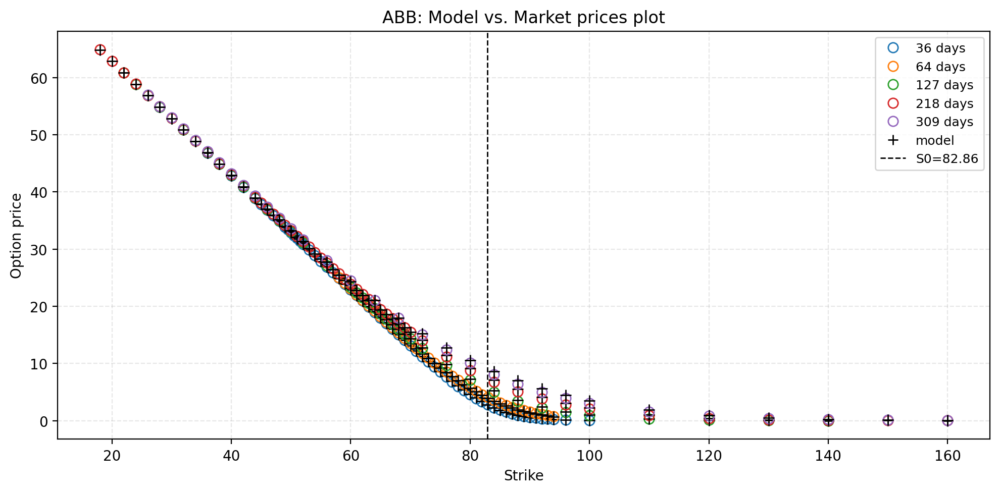

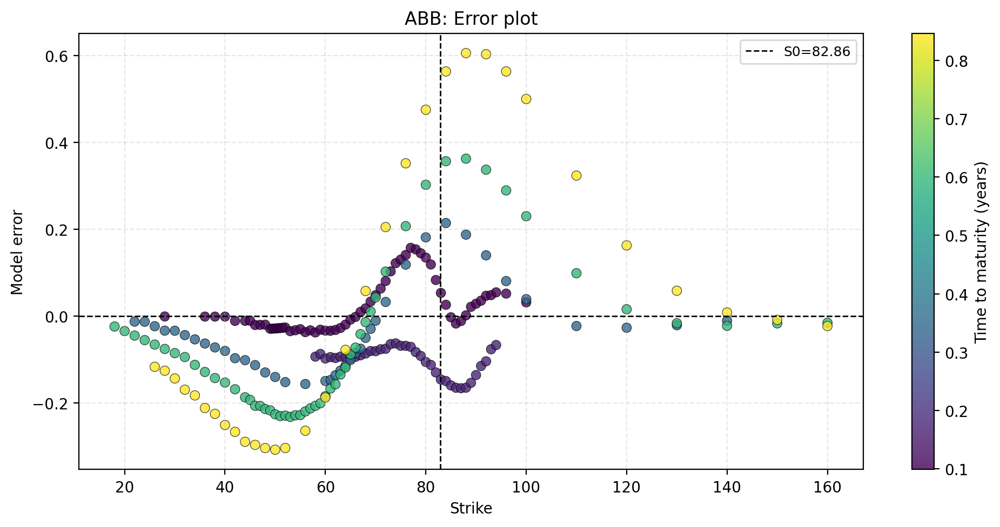

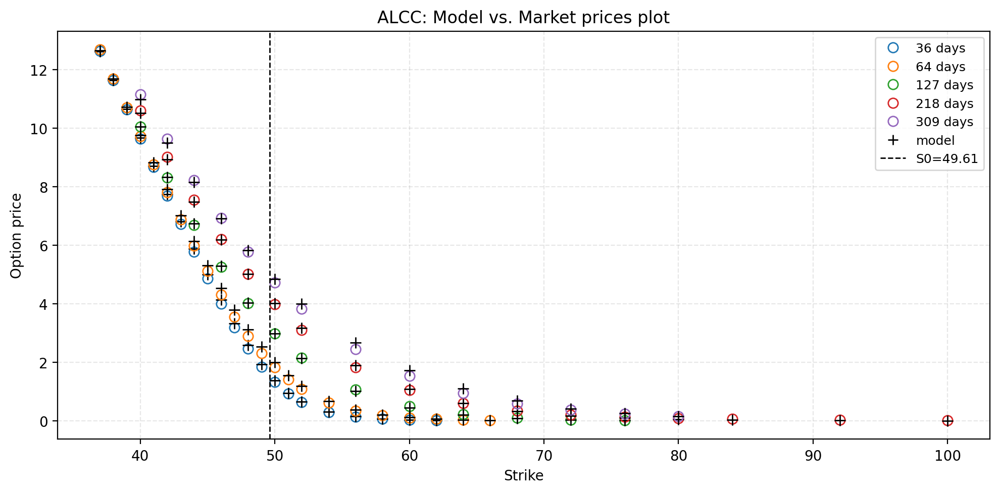

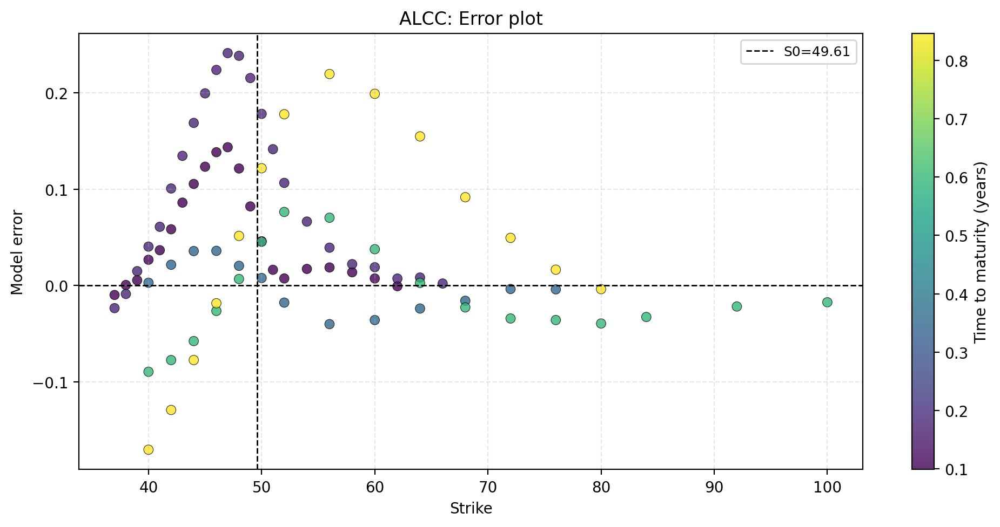

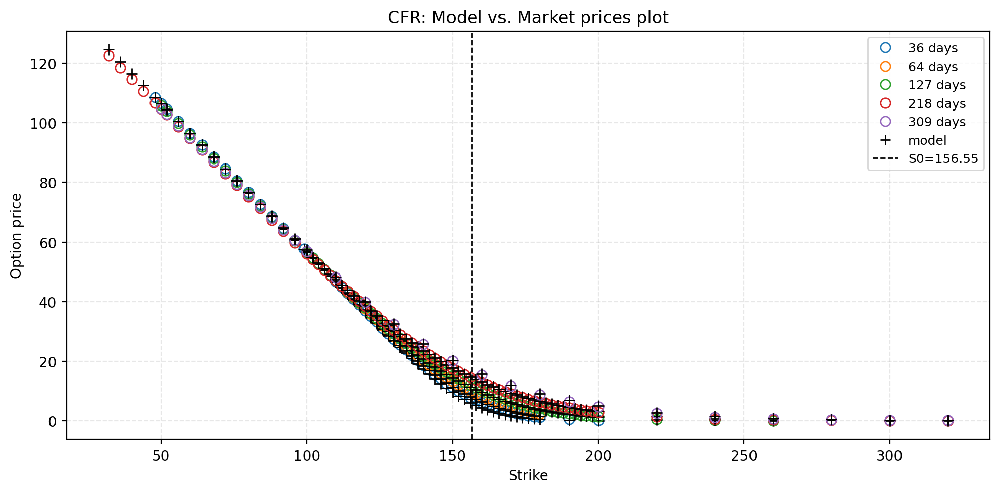

...

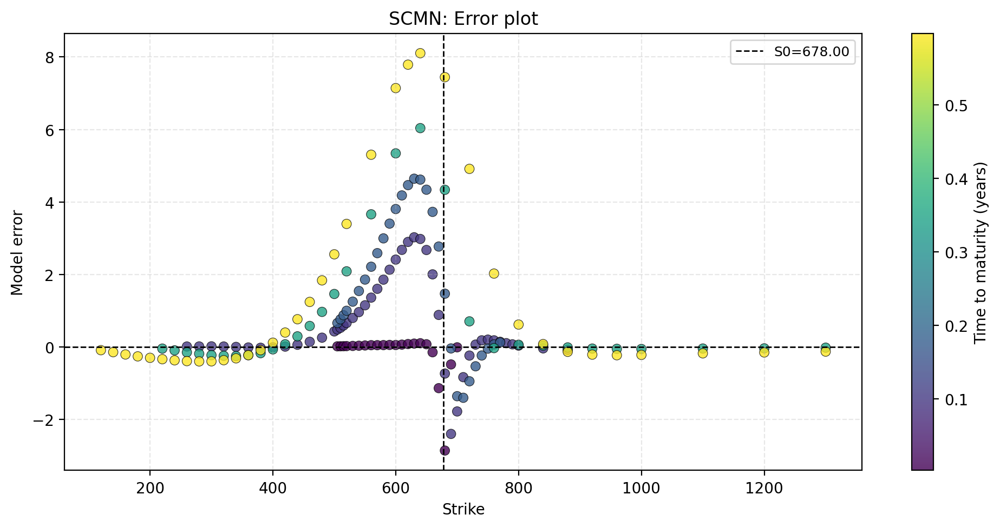

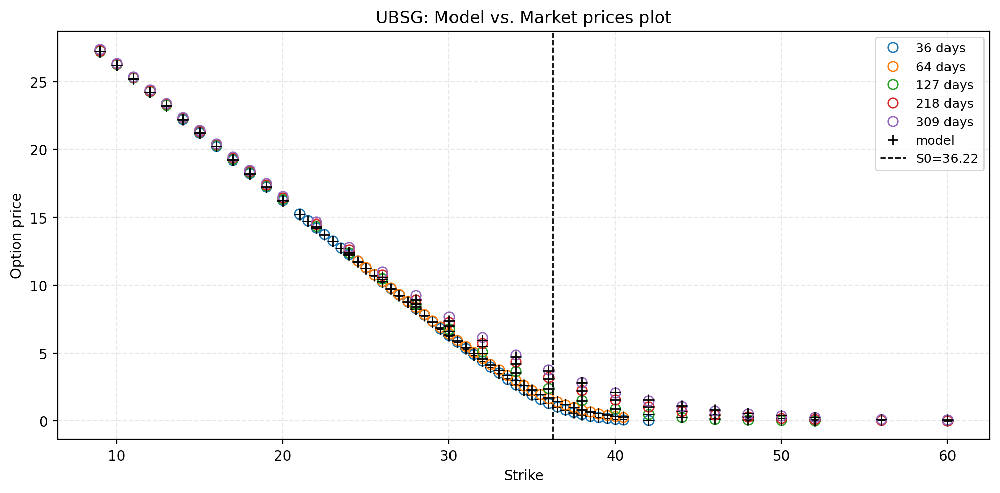

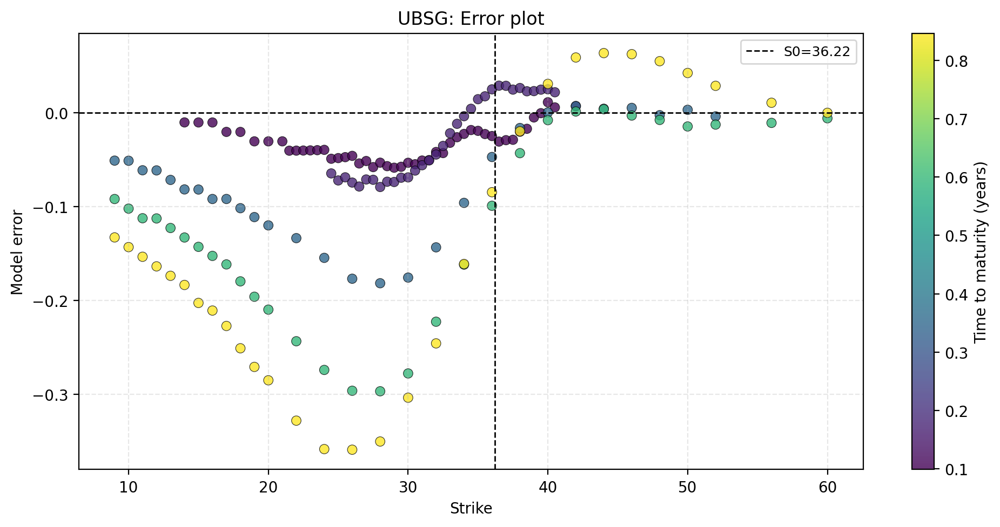

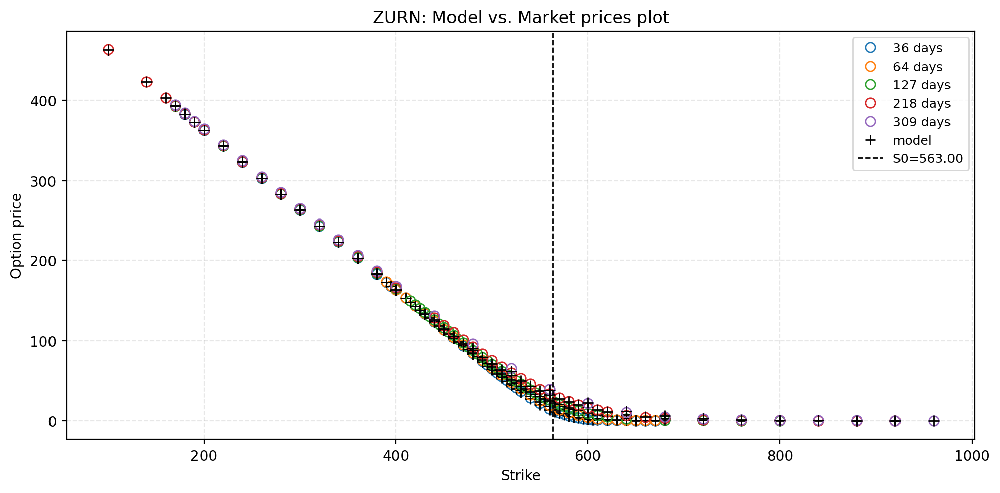

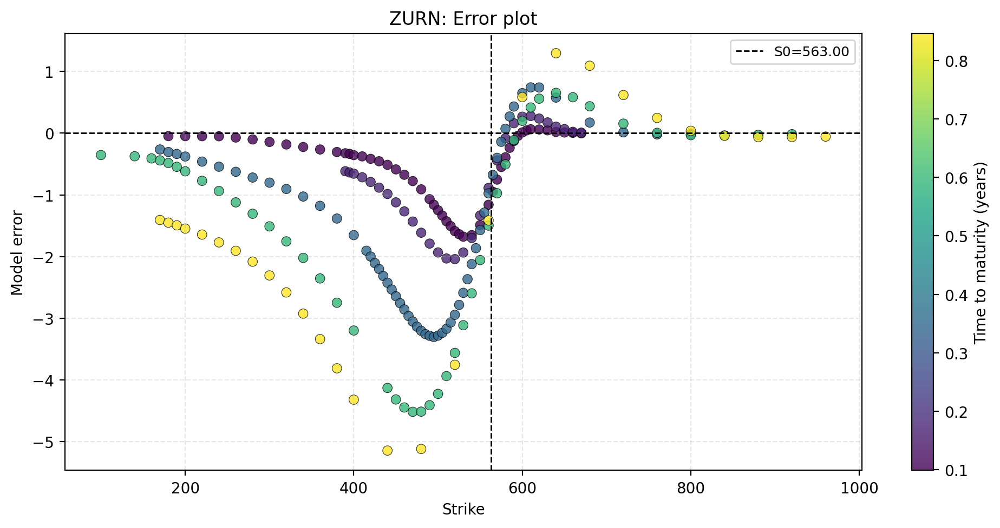

In [14]:
def plot_strike_slices(df, S0, price_col='FFT_price', plot_title='FFT calibration'):
    ttms = np.sort(df['time_to_maturity_years'].dropna().unique())
    ttm_days = (ttms * 365).astype(int)

    cmap = plt.get_cmap('tab10')
    fig, ax = plt.subplots(figsize=(10, 5), dpi=100)

    for i, (tau, tau_days) in enumerate(zip(ttms, ttm_days)):
        sub = df[np.isclose(df['time_to_maturity_years'], tau, atol=1e-10, rtol=0.0)].sort_values('strike')
        color = cmap(i % 10)

        ax.plot(sub['strike'], sub['price'], marker='o', linestyle='none', markersize=7, markerfacecolor='none', markeredgecolor=color, label=f'{tau_days} days')
        ax.plot(sub['strike'], sub[price_col], marker='+', linestyle='none', markersize=8, color='k', label='_nolegend_')

    ax.plot([], [], marker='+', linestyle='none', color='k', markersize=7, label='model')
    ax.axvline(x=S0, linestyle='--', linewidth=1, color='k', label=f'S0={S0:.2f}')
    ax.set_xlabel('Strike')
    ax.set_ylabel('Option price')
    ax.set_title(plot_title)
    ax.grid(True, linestyle='--', alpha=0.3)
    ax.legend(loc='best', fontsize=9)
    fig.tight_layout()
    plt.show()


def plot_residuals_vs_strike(df, S0, error_col='FFT_error', plot_title='FFT residuals'):
    fig, ax = plt.subplots(figsize=(10, 5), dpi=100)
    sc = ax.scatter(df['strike'], df[error_col], c=df['time_to_maturity_years'], s=40, alpha=0.8, marker='o', edgecolors='k', linewidths=0.4)

    ax.axhline(0.0, color='k', linestyle='--', lw=1)
    ax.axvline(x=S0, linestyle='--', linewidth=1, color='k', label=f'S0={S0:.2f}')
    ax.set_xlabel('Strike')
    ax.set_ylabel('Model error')
    ax.grid(True, linestyle='--', alpha=0.3)
    ax.set_title(plot_title)
    ax.legend(loc='best', fontsize=9)

    cbar = fig.colorbar(sc, ax=ax)
    cbar.set_label('Time to maturity (years)')
    fig.tight_layout()
    plt.show()


PLOT_RESULTS = True

if PLOT_RESULTS:
    for i, ticker in enumerate(tickers):
        plot_strike_slices(dfs[i], stock_prices[i], plot_title=f'{ticker}: Model vs. Market prices plot')
        plot_residuals_vs_strike(dfs[i], stock_prices[i], plot_title=f'{ticker}: Error plot')


## 3. Computing correlation and drift terms using stocks data

In [15]:
stock_price_dfs = []

for ticker, path in filepaths_stocks_and_dividends.items():
    df_stock = pd.read_excel(path, sheet_name='Stock Data')

    df_stock = df_stock.rename(columns={'Timestamp': 'Date', 'TRDPRC_1': ticker})
    df_stock['Date'] = pd.to_datetime(df_stock['Date'])
    df_stock = df_stock[df_stock['Date'] > pd.to_datetime('2024-05-14')]

    df_stock = df_stock[['Date', ticker]]
    df_stock = df_stock.set_index('Date').sort_index()

    stock_price_dfs.append(df_stock)

stocks_df = pd.concat(stock_price_dfs, axis=1, join='inner').sort_index()
stocks_df = stocks_df[tickers]
stocks_df.head()

,ABB,ALCC,CFR,GALD,GEBN,GIVN,HOLN,LONN,NESN,NOVN,PGHN,ROPC,SDZ,SGSN,SIKA,SLHN,SRENH,SCMN,UBSG,ZURN
Date,,,,,,,,,,,,,,,,,,,,
2024-05-15,48.20,80.72,136.55,73.00,566.2,4112,40.334010,532.2,95.54,93.30,1279.0,227.5,32.26,81.18,283.4,654.6,103.70,503.5,27.67,453.3
2024-05-16,47.65,80.88,137.45,74.83,565.6,4107,39.856384,527.4,95.42,92.62,1276.0,234.8,32.27,81.08,281.4,662.6,107.65,502.0,27.42,469.1
2024-05-17,47.41,80.08,144.75,73.88,561.4,4180,39.876708,529.2,96.62,93.37,1258.0,237.1,31.99,80.72,281.7,626.6,110.10,503.0,27.54,471.8
2024-05-21,48.46,80.44,143.55,74.64,558.2,4196,39.785248,507.8,95.30,93.89,1263.5,234.4,31.88,81.30,282.4,629.2,110.30,499.2,27.70,472.8
2024-05-22,48.11,82.44,140.60,73.49,561.4,4177,40.151089,510.6,95.06,93.16,1262.0,231.9,32.08,83.16,281.5,616.4,110.70,497.4,27.61,471.6


### 3.1 Computing the drift

In [16]:
print(len(stocks_df))

498


In [17]:
significance_level = 0.025
upper_quantile = 1 - significance_level

dt = 2/(252)

log_returns = np.log(stocks_df).diff().dropna()
annual_log_return = log_returns.mean()/dt

r_cap_975 = log_returns.quantile(upper_quantile)

log_returns_cap = log_returns.clip(upper=r_cap_975, axis=1)
annual_log_return_cap = log_returns_cap.mean()/dt

for col in ['sigma', 'theta', 'nu']:
    df_FFT[col] = pd.to_numeric(df_FFT[col], errors='coerce')

q_by_ticker = {}

for ticker in tickers:
    S0_i = float(option_dfs[ticker]['S0'].dropna().iloc[0])
    D_i = float(option_dfs[ticker]['projected_dividend'].dropna().iloc[0])
    q_by_ticker[ticker] = -np.log(1 - D_i / S0_i)

df_FFT['annual_log_return'] = df_FFT['TKR'].map(annual_log_return)
df_FFT['annual_log_return_cap'] = df_FFT['TKR'].map(annual_log_return_cap)
df_FFT['q'] = df_FFT['TKR'].map(q_by_ticker)

df_FFT['omega'] = np.log(1 - df_FFT['theta']*df_FFT['nu'] - 0.5*df_FFT['nu']*df_FFT['sigma']**2)/df_FFT['nu']

df_FFT['mu_uncapped'] = df_FFT['annual_log_return'] - df_FFT['omega'] - df_FFT['theta']
df_FFT['mu_cap'] = df_FFT['annual_log_return_cap'] - df_FFT['omega'] - df_FFT['theta']

df_FFT['mu'] = df_FFT['mu_cap']
df_FFT.loc[(df_FFT['mu_uncapped']<0) & (df_FFT['mu_cap']<0), 'mu'] = df_FFT.loc[(df_FFT['mu_uncapped']<0) & (df_FFT['mu_cap']<0), 'mu_uncapped']
df_FFT.loc[(df_FFT['mu_uncapped']>0) & (df_FFT['mu_cap']<0), 'mu'] = df_FFT.loc[(df_FFT['mu_uncapped']>0) & (df_FFT['mu_cap']<0), 'mu_uncapped']

df_FFT['mu_Q'] = df_FFT['r'] - df_FFT['q']

df_FFT

,TKR,S0,r,C,G,M,sigma,theta,nu,objective_value,...,nit,nfev,annual_log_return,annual_log_return_cap,q,omega,mu_uncapped,mu_cap,mu,mu_Q
0,ABB,82.86,-0.0004,12.028845,12.968054,21.431640,0.294213,-0.366309,0.083134,2.031208,...,87,26400,0.137356,0.079552,0.011919,0.318768,0.184898,0.127094,0.127094,-0.012319
1,ALCC,49.61,-0.0004,11.271924,14.032037,21.542191,0.273092,-0.280050,0.088716,2.463056,...,87,26400,-0.123413,-0.148775,0.005660,0.240184,-0.083546,-0.108908,-0.083546,-0.006060
2,CFR,156.55,-0.0004,106.265383,48.271206,48.273558,0.302004,-0.000107,0.009410,5.183002,...,112,33900,0.034652,-0.045289,0.021127,-0.045506,0.080265,0.000324,0.000324,-0.021527
3,GALD,158.35,-0.0004,27.445113,17.934348,40.144548,0.276116,-0.846653,0.036436,0.750532,...,102,30900,0.196314,0.137603,0.004430,0.796852,0.246114,0.187403,0.187403,-0.004830
4,GEBN,503.40,-0.0004,88.253821,58.969168,65.840212,0.213218,-0.156185,0.011331,1.195198,...,111,33600,-0.029805,-0.073272,0.026165,0.133354,-0.006973,-0.050440,-0.006973,-0.026565
5,GIVN,2683.00,-0.0004,2.618908,5.165600,15.376532,0.256794,-0.336672,0.381838,14.656327,...,84,25500,-0.108247,-0.131122,0.027990,0.287344,-0.058919,-0.081794,-0.058919,-0.028390
6,HOLN,76.26,-0.0004,20.039086,20.850715,30.237841,0.252126,-0.298359,0.049902,6.051836,...,74,22500,0.161481,0.100046,0.046050,0.264817,0.195023,0.133587,0.133587,-0.046450
7,LONN,474.20,-0.0004,17.456671,17.845342,25.153005,0.278893,-0.284201,0.057285,9.817754,...,95,28800,-0.029254,-0.070371,0.013268,0.243602,0.011345,-0.029772,0.011345,-0.013668
8,NESN,76.88,-0.0004,12.186183,19.116281,37.332470,0.184801,-0.311054,0.082060,4.543271,...,88,26700,-0.055090,-0.111189,0.041847,0.290488,-0.034524,-0.090624,-0.034524,-0.042247
9,NOVN,116.80,-0.0004,54.732930,45.214604,57.048538,0.206005,-0.251105,0.018271,0.568058,...,101,30600,0.056952,0.039936,0.034062,0.229404,0.078652,0.061636,0.061636,-0.034462


### 3.2 Correlation matrix

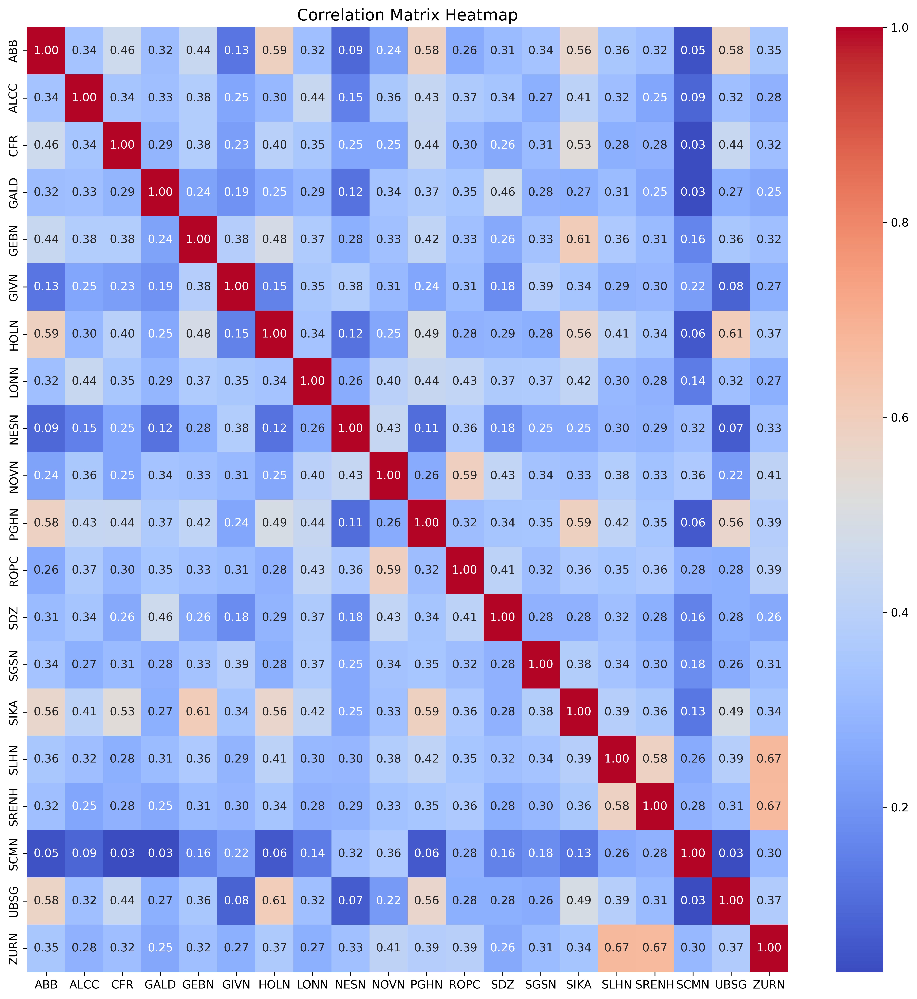

In [18]:
log_returns_corr_matrix = log_returns_cap.corr()
#log_returns_corr_matrix

plt.figure(figsize=(15, 15), dpi=300)
sns.heatmap(log_returns_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap', fontsize=14)
plt.show()

## 4. Saving the results

In [19]:
filepath_FFT_results = Path('./FFTResults/CalibrationResults/')
filepath_FFT_results.mkdir(parents=True, exist_ok=True)
output_file = filepath_FFT_results/'FFT_calibration_all_results.xlsx'

with pd.ExcelWriter(output_file) as writer:
    df_FFT.to_excel(writer, sheet_name='Parameter estimates', index=False)
    errors_df.to_excel(writer, sheet_name='Errors', index=False)

In [21]:
df_calibration = df_FFT[['TKR', 'S0', 'r', 'mu', 'mu_uncapped', 'mu_Q', 'C', 'G', 'M', 'sigma', 'theta', 'nu']]
df_calibration.to_excel(filepath_FFT_results/'FFT_estimates.xlsx', index=False)

log_returns_corr_matrix.to_excel(filepath_FFT_results/'corr_matrix.xlsx', index=False)

df_calibration

,TKR,S0,r,mu,mu_uncapped,mu_Q,C,G,M,sigma,theta,nu
0,ABB,82.86,-0.0004,0.127094,0.184898,-0.012319,12.028845,12.968054,21.431640,0.294213,-0.366309,0.083134
1,ALCC,49.61,-0.0004,-0.083546,-0.083546,-0.006060,11.271924,14.032037,21.542191,0.273092,-0.280050,0.088716
2,CFR,156.55,-0.0004,0.000324,0.080265,-0.021527,106.265383,48.271206,48.273558,0.302004,-0.000107,0.009410
3,GALD,158.35,-0.0004,0.187403,0.246114,-0.004830,27.445113,17.934348,40.144548,0.276116,-0.846653,0.036436
4,GEBN,503.40,-0.0004,-0.006973,-0.006973,-0.026565,88.253821,58.969168,65.840212,0.213218,-0.156185,0.011331
5,GIVN,2683.00,-0.0004,-0.058919,-0.058919,-0.028390,2.618908,5.165600,15.376532,0.256794,-0.336672,0.381838
6,HOLN,76.26,-0.0004,0.133587,0.195023,-0.046450,20.039086,20.850715,30.237841,0.252126,-0.298359,0.049902
7,LONN,474.20,-0.0004,0.011345,0.011345,-0.013668,17.456671,17.845342,25.153005,0.278893,-0.284201,0.057285
8,NESN,76.88,-0.0004,-0.034524,-0.034524,-0.042247,12.186183,19.116281,37.332470,0.184801,-0.311054,0.082060
9,NOVN,116.80,-0.0004,0.061636,0.078652,-0.034462,54.732930,45.214604,57.048538,0.206005,-0.251105,0.018271
